# Final Project

## Ali LAMINE

Contents
1. Understand the problem
2. Choose an appropriate data
3. Prepare the data
4. Do some visualization
5. Choose the right algorithm
6. Model
7. Experiment

## 1.Understand the problem

Sepsis is a significant public health problem across the world, with more than 31 million cases annually and a 17% mortality.

“Sepsis is a life-threatening condition that arises when the body’s response to an infection injures its own tissues and organs”.
Singer M, Deutschman CS, Seymour CW, Shankar-Hari M, Annane D, Bauer M, et al. The third international consensus definitions for sepsis and septic shock (sepsis-3) JAMA. 2016;315:801–810.

Sepsis is the host response to microbial pathogens resulting in significant morbidity and mortality. An accurate and timely diagnosis of sepsis allows prompt and appropriate treatment. 

Machine learning-based clinical decision support tools for sepsis create opportunities to identify at-risk patients and initiate treatments earlier, critical to improving sepsis outcomes.

## 2.Choose an appropriate data

Sepsis: a dataset for practicing to classify the sepsis illness only
    
available on: 
    
https://www.kaggle.com/datasets/chaunguynnghunh/sepsis

2 files: 

1.training dataset

2.test dataset
    
About this file

ID: number to represent patient ID

PRG: Plasma glucose

PL: Blood Work Result-1 (mu U/ml)

PR: Blood Pressure (mm Hg)

SK: Blood Work Result-2 (mm)

TS: Blood Work Result-3 (mu U/ml)

M11: Body mass index (weight in kg/(height in m)^2

BD2: Blood Work Result-4 (mu U/ml)

Age: patients age (years)

Insurance: If a patient holds a valid insurance card

Sepsis: Positive: if a patient in ICU will develop a sepsis , and Negative: otherwis

## 3.Prepare the data

In [1]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 

### Training Dataset

In [2]:
data_train=pd.read_csv("C:/Users/LENOVO/Desktop/archive/Paitients_Files_Train.csv")
data_train.head()

,ID,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,Sepssis
0,ICU200010,6,148,72,35,0,33.6,0.627,50,0,Positive
1,ICU200011,1,85,66,29,0,26.6,0.351,31,0,Negative
2,ICU200012,8,183,64,0,0,23.3,0.672,32,1,Positive
3,ICU200013,1,89,66,23,94,28.1,0.167,21,1,Negative
4,ICU200014,0,137,40,35,168,43.1,2.288,33,1,Positive


In [3]:
data_train.shape

(599, 11)

In [4]:
# general information 
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 599 entries, 0 to 598
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ID         599 non-null    object 
 1   PRG        599 non-null    int64  
 2   PL         599 non-null    int64  
 3   PR         599 non-null    int64  
 4   SK         599 non-null    int64  
 5   TS         599 non-null    int64  
 6   M11        599 non-null    float64
 7   BD2        599 non-null    float64
 8   Age        599 non-null    int64  
 9   Insurance  599 non-null    int64  
 10  Sepssis    599 non-null    object 
dtypes: float64(2), int64(7), object(2)
memory usage: 51.6+ KB


In [5]:
# Find missing data
data_train.isnull().sum().sum()

0

In [6]:
data_train['Sepssis'] = data_train['Sepssis'].map({'Positive': 1, 'Negative': 0})

In [7]:
data_train.describe()

,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,Sepssis
count,599.000000,599.000000,599.000000,599.000000,599.000000,599.000000,599.000000,599.000000,599.000000,599.000000
mean,3.824708,120.153589,68.732888,20.562604,79.460768,31.920033,0.481187,33.290484,0.686144,0.347245
std,3.362839,32.682364,19.335675,16.017622,116.576176,8.008227,0.337552,11.828446,0.464447,0.476492
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000,0.000000
25%,1.000000,99.000000,64.000000,0.000000,0.000000,27.100000,0.248000,24.000000,0.000000,0.000000
50%,3.000000,116.000000,70.000000,23.000000,36.000000,32.000000,0.383000,29.000000,1.000000,0.000000
75%,6.000000,140.000000,80.000000,32.000000,123.500000,36.550000,0.647000,40.000000,1.000000,1.000000
max,17.000000,198.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000,1.000000


### Test Dataset

In [8]:
data_test=pd.read_csv("C:/Users/LENOVO/Desktop/archive/Paitients_Files_Test.csv")
data_test.head()

,ID,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance
0,ICU200609,1,109,38,18,120,23.1,0.407,26,1
1,ICU200610,1,108,88,19,0,27.1,0.400,24,1
2,ICU200611,6,96,0,0,0,23.7,0.190,28,1
3,ICU200612,1,124,74,36,0,27.8,0.100,30,1
4,ICU200613,7,150,78,29,126,35.2,0.692,54,0


In [9]:
data_test.shape

(169, 10)

In [10]:
data_test.isnull().sum().sum()

0

No target variable available in this dataset, it would be interesting to make unsupervised learning with this dataset!!!

Only the training dataset will be used for supervised learning!!!

let's make some visualization with the training dataset!!!

## 4.Do some visualization

In [11]:
# from now on data_train will be reffered as data
data=data_train

In [12]:
# disable warnings
import warnings
warnings.filterwarnings('ignore')

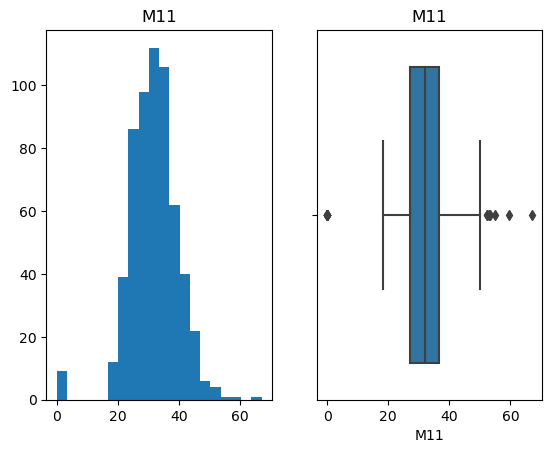

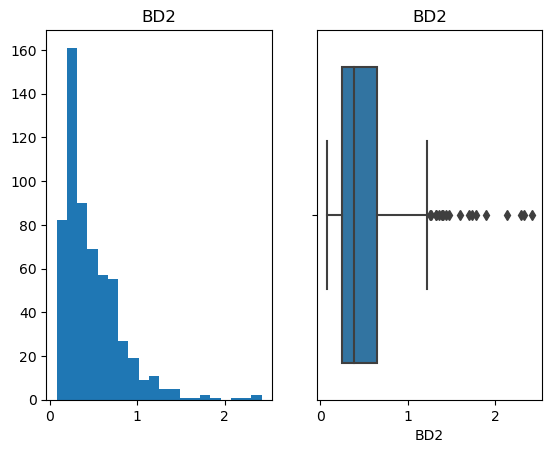

In [13]:
# Data Visualization
for col in data.columns:
    if data[col].dtypes=="float64":
        plt.subplot(1,2,1)
        plt.hist(data[col], bins=20)
        plt.title(col)
        plt.subplot(1,2,2)
        sns.boxplot(data[col], orient="h")
        plt.title(col)
        plt.show()

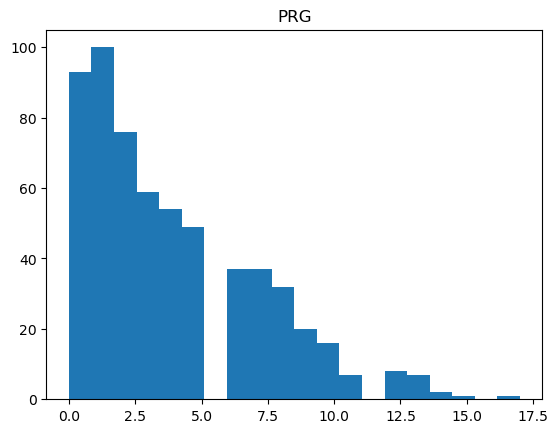

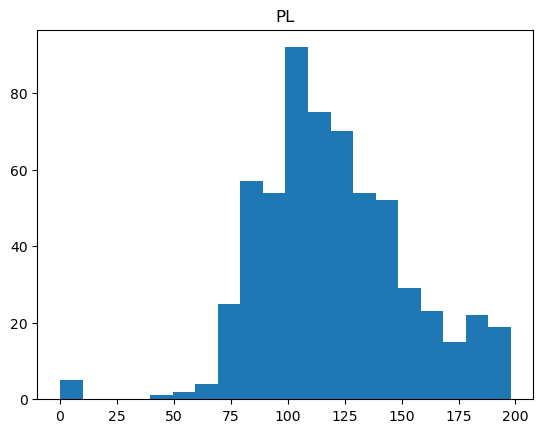

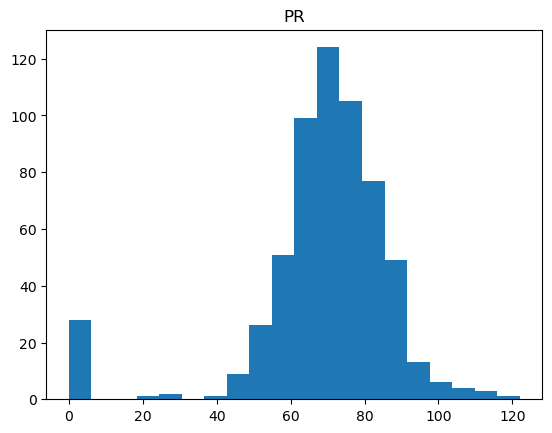

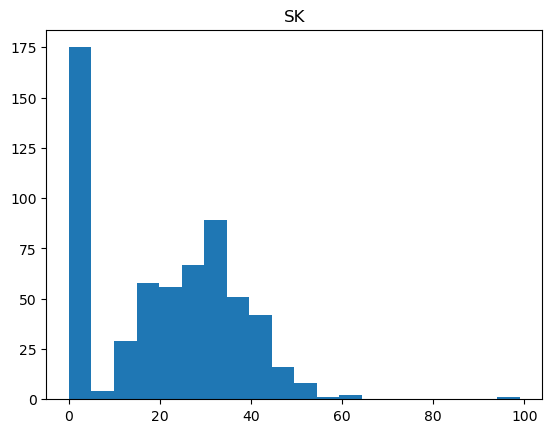

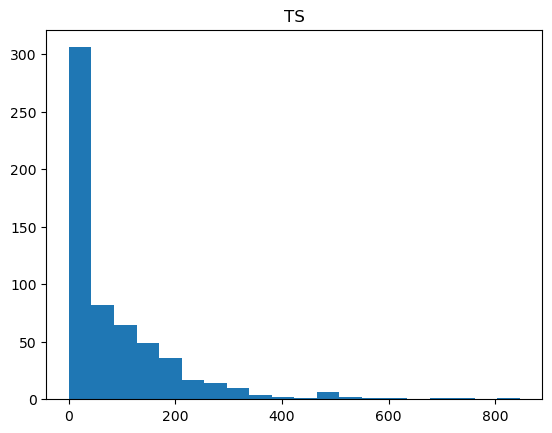

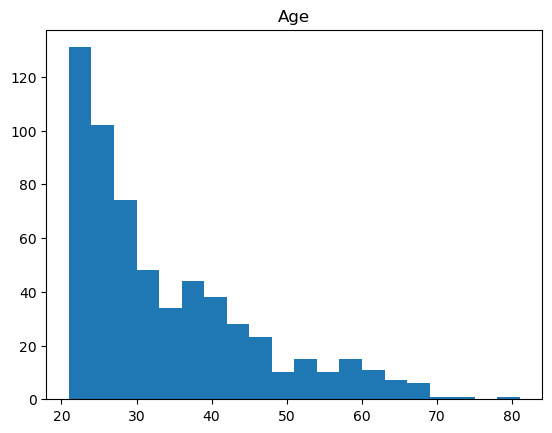

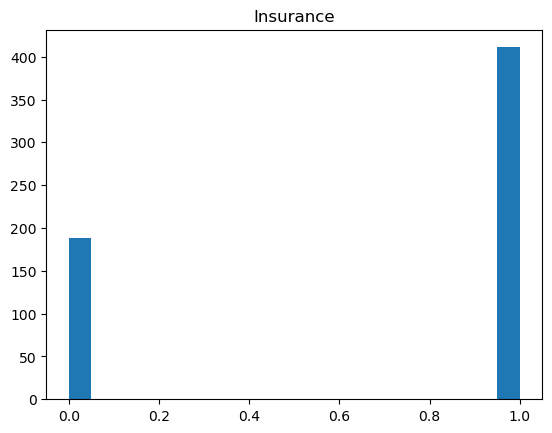

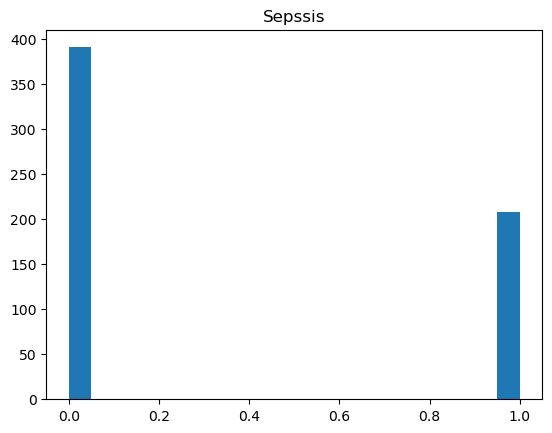

In [14]:
for col in data.columns:
    if data[col].dtypes=="int64":
        plt.hist(data[col], bins=20)
        plt.title(col)
        plt.show()

Blood work:

BD2: skewed , median=0.4

PL: normally distributed, mean=120

Sk: skewed, mean=20

TS: skewed, mean=79


Plasma Glucose:

PRG: skewed, mean=3.82


Body Index:

Ml1: normally distributed, median=35


Blood pressure

PR: normally distributed, median=70


Age: skewed, mean=33.29


Insurance:

Patients with an insurance are the double of those with no insurance


Sepsis:

patients who developped sepsis are the half of those who didn't. 


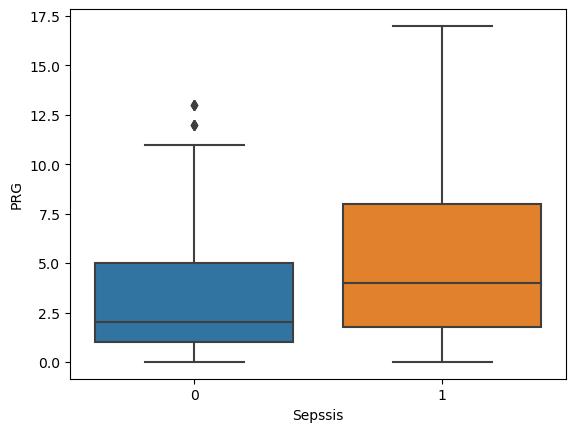

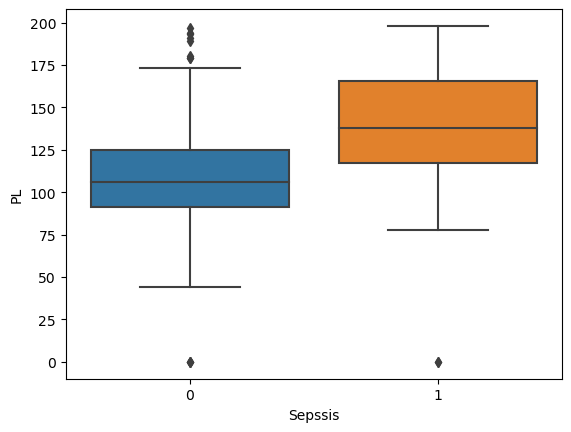

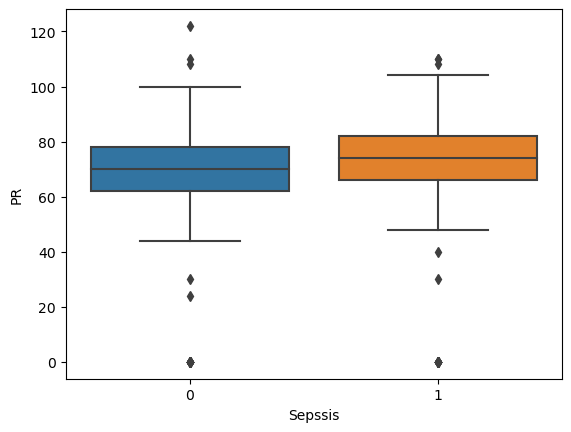

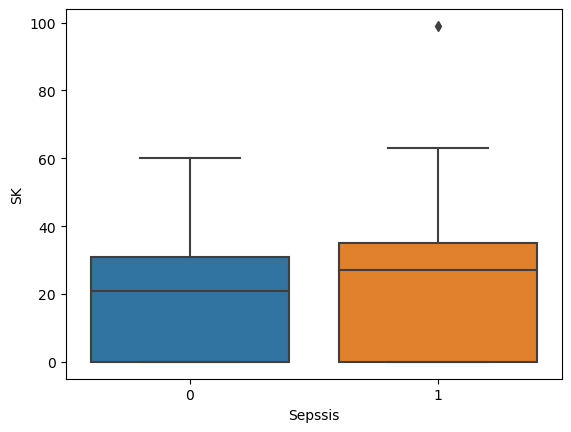

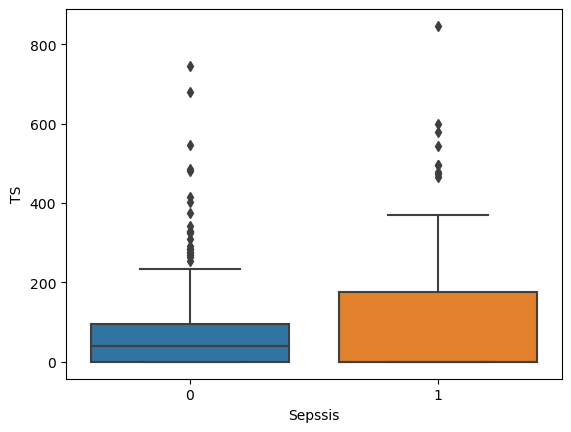

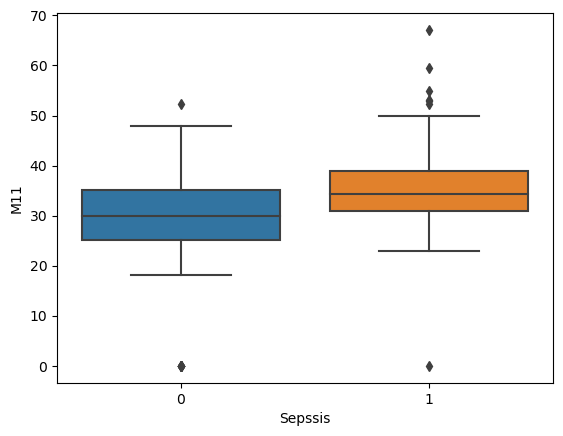

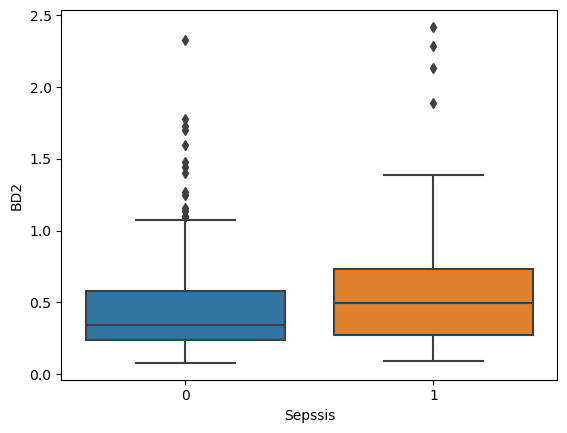

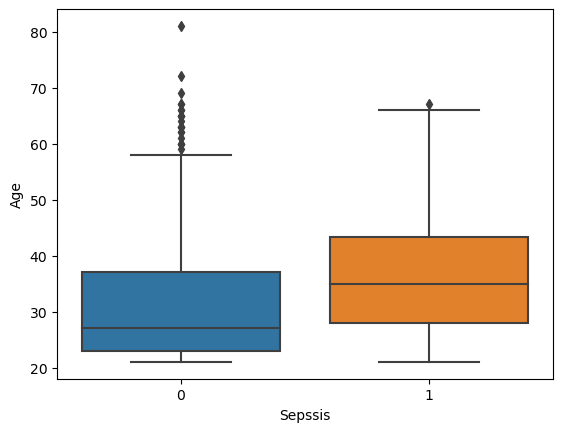

In [15]:
# Grouped Boxplots with "Sepssis"
L=["PRG","PL","PR","SK","TS","M11","BD2","Age"]
for col in L:
    sns.boxplot(data= data, y=col, x="Sepssis") 
    plt.show()

<AxesSubplot:xlabel='Insurance', ylabel='count'>

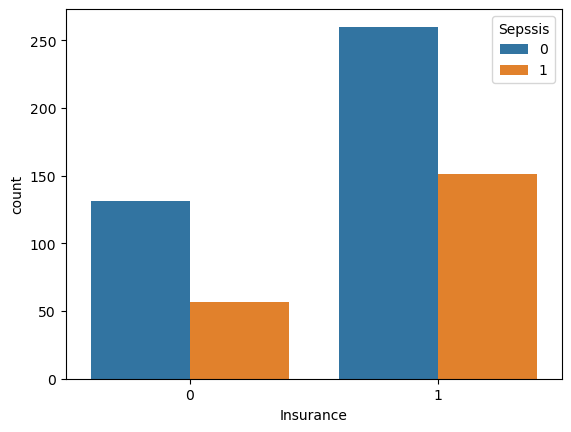

In [16]:
sns.countplot(data= data, x="Insurance", hue="Sepssis") 

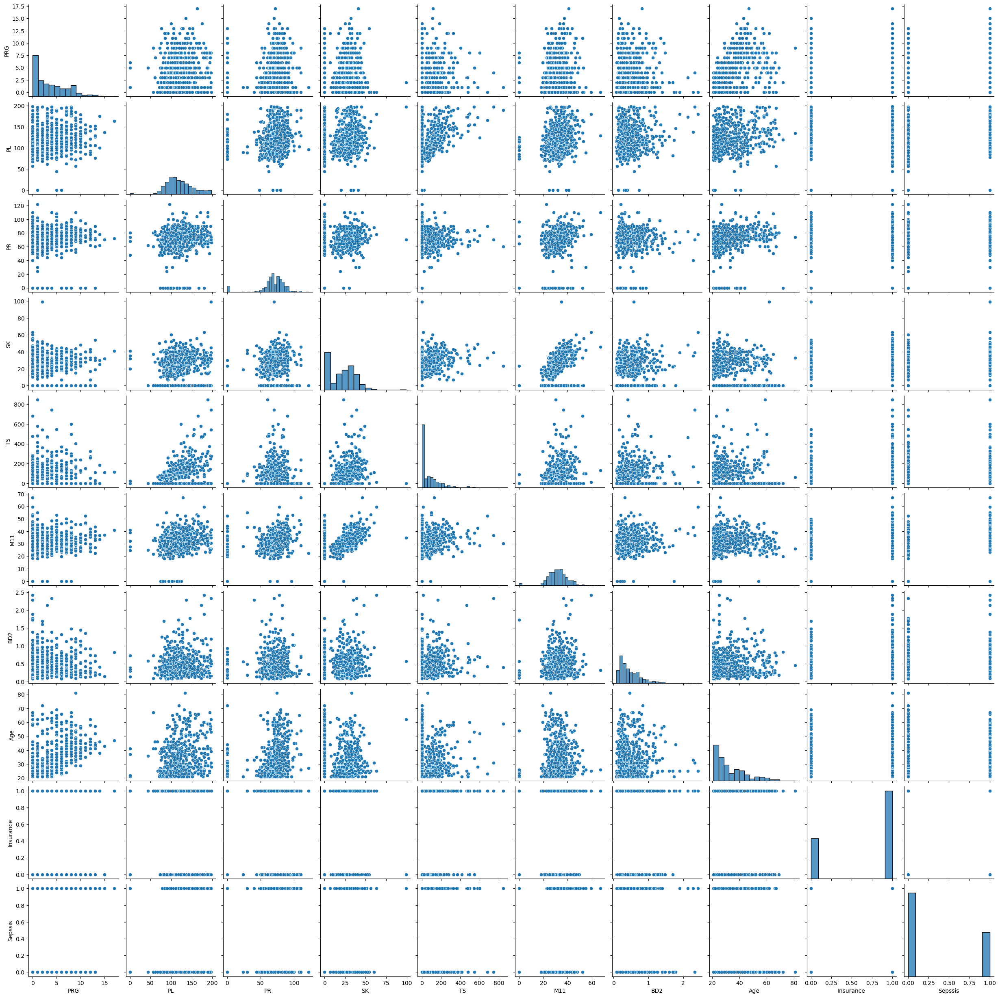

In [17]:
sns.pairplot(data)

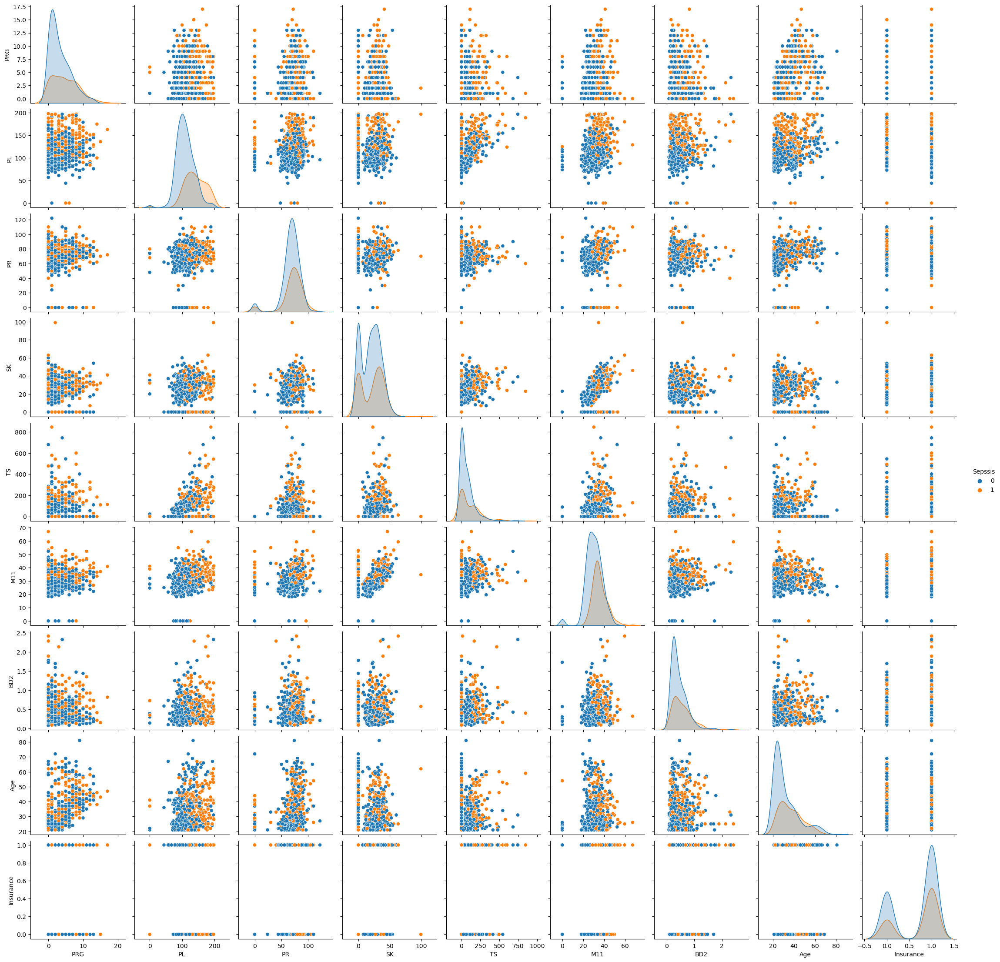

In [18]:
sns.pairplot(data, hue="Sepssis")

Visually, patients who developped sepsis had higher PRG, Ml1, BD2 and especially higher PL and Age!!!

In [19]:
# Heatmap
import plotly.express as px
corr=data.corr()
fig = px.imshow(corr, text_auto=".2f",color_continuous_scale='magma')
fig.show()

There are no strong correlations between Sepssis and the other variables.

Age and PRG are slightly correlated.

## 5.Choose the right algorithm

Since "Sepssis" is the label of the data, our problem can be fixed with supervised Machine learning. 

The target data is categorical, so we will use "Classification" algorithms:
    
- Logistic regression

- KNN

- Decision Tree

- Random forest



## 6.Model

### Logistic Regression

In [20]:
# import relevant librairies
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import classification_report

In [21]:
# features extraction
x=data.drop(["ID","Sepssis"], axis=1)
y=data["Sepssis"].values

In [22]:
# splitting the data with test size of 25%
x_train,x_test,y_train,y_test= train_test_split(x,y, test_size=0.25, random_state=0)
# build logistic regression 
logreg=LogisticRegression()
# fitting the training data
logreg.fit(x_train,y_train)
# testing the model's performance
y_pred=logreg.predict(x_test)
print("Accuracry={:.2f}".format(logreg.score(x_test,y_test)))

Accuracry=0.79


In [23]:
# Classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.79      0.91      0.84        96
           1       0.78      0.57      0.66        54

    accuracy                           0.79       150
   macro avg       0.78      0.74      0.75       150
weighted avg       0.79      0.79      0.78       150



In [24]:
# Matthews correlation coefficient
from sklearn.metrics import matthews_corrcoef
matthews_corrcoef(y_test, y_pred)

0.5213633666657163

In [25]:
# confusion matrix
confusion_matrix=pd.crosstab(y_test, y_pred, rownames=["Actual"], colnames=["Predicted"])
confusion_matrix

Predicted,0,1
Actual,,
0,87,9
1,23,31


<AxesSubplot:xlabel='Predicted', ylabel='Actual'>

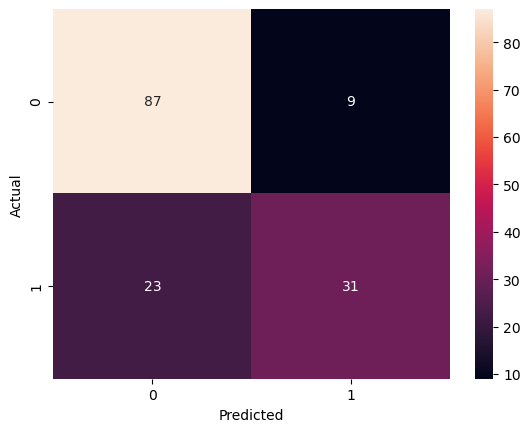

In [26]:
sns.heatmap(confusion_matrix, annot=True)

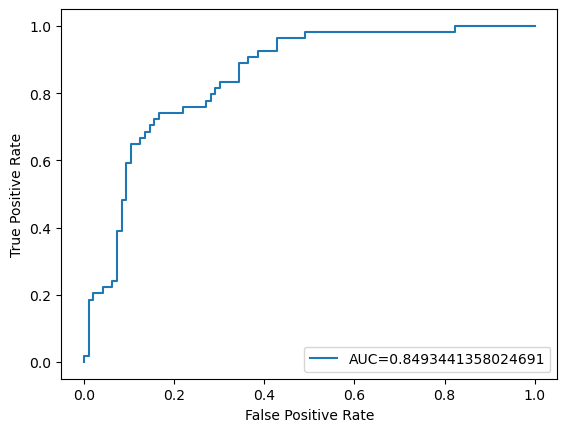

In [27]:
# ROC
#define metrics
y_pred_proba = logreg.predict_proba(x_test)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
#create ROC curve
plt.plot(fpr,tpr,label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

### KNN

In [28]:
# features extraction
x=data.drop(["ID","Sepssis"], axis=1)
y=data["Sepssis"].values 
  
# Splitting the dataset into training and test set.  
from sklearn.model_selection import train_test_split  
x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.25, random_state=0)  
  
#feature Scaling  
from sklearn.preprocessing import StandardScaler    
st_x= StandardScaler()    
x_train= st_x.fit_transform(x_train)    
x_test= st_x.transform(x_test)  

In [29]:
#Fitting K-NN classifier to the training set  
from sklearn.neighbors import KNeighborsClassifier  
knn= KNeighborsClassifier(n_neighbors=5)  
knn.fit(x_train, y_train)  

KNeighborsClassifier()

In [30]:
#Predicting the test set result  
y_pred= knn.predict(x_test)  
from sklearn.metrics import accuracy_score
print("Accuracy= ", accuracy_score(y_pred, y_test))

Accuracy=  0.7333333333333333


#### Optimal K value 

###### 1st Method

Accuracy for k= 1 is: 0.68
Accuracy for k= 2 is: 0.69
Accuracy for k= 3 is: 0.72
Accuracy for k= 4 is: 0.71
Accuracy for k= 5 is: 0.73
Accuracy for k= 6 is: 0.75
Accuracy for k= 7 is: 0.75
Accuracy for k= 8 is: 0.74
Accuracy for k= 9 is: 0.77
Accuracy for k= 10 is: 0.72
Accuracy for k= 11 is: 0.73
Accuracy for k= 12 is: 0.71
Accuracy for k= 13 is: 0.73
Accuracy for k= 14 is: 0.73
Accuracy for k= 15 is: 0.73
Accuracy for k= 16 is: 0.71
Accuracy for k= 17 is: 0.73
Accuracy for k= 18 is: 0.69
Accuracy for k= 19 is: 0.69
Accuracy for k= 20 is: 0.69
Accuracy for k= 21 is: 0.71
Accuracy for k= 22 is: 0.7
Accuracy for k= 23 is: 0.7
Accuracy for k= 24 is: 0.71
Accuracy for k= 25 is: 0.69
Accuracy for k= 26 is: 0.7
Accuracy for k= 27 is: 0.71
Accuracy for k= 28 is: 0.69
Accuracy for k= 29 is: 0.7


Text(0, 0.5, 'Testing Accuracy')

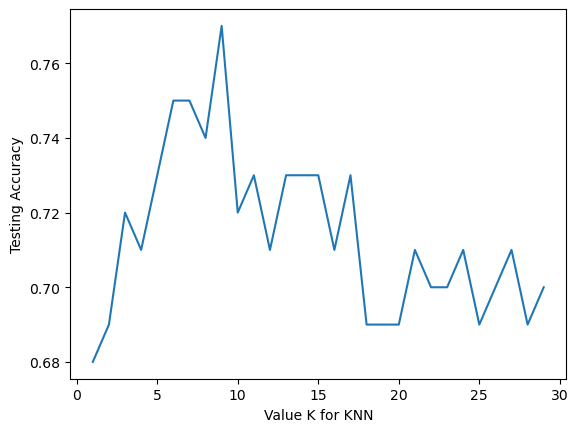

In [31]:
# Optimal K value
n_neighbors=30
scores=[]
for k in range(1,30):
    knn=KNeighborsClassifier(n_neighbors=k)
    knn.fit(x_train, y_train)
    y_pred=knn.predict(x_test)
    print("Accuracy for k=",k, "is:",round(accuracy_score(y_pred,y_test),2))
    scores.append(round(accuracy_score(y_pred, y_test),2))
    
# Optimal K value plot
import matplotlib.pyplot as plt
plt.plot(range(1,30), scores)
plt.xlabel("Value K for KNN")
plt.ylabel("Testing Accuracy")

###### 2nd Method

In [32]:
knn = KNeighborsClassifier()
from sklearn.model_selection import GridSearchCV
k_range = list(range(1, 51))
metric=["euclidean", "manhattan", "minkowski"]
param_grid = dict(n_neighbors=k_range, metric=metric)
  
# defining parameter range
grid = GridSearchCV(knn, param_grid, cv=10, scoring='accuracy', return_train_score=False,verbose=1)
  
# fitting the model for grid search
grid_search=grid.fit(x_train, y_train)
print(grid_search.best_params_)

Fitting 10 folds for each of 150 candidates, totalling 1500 fits
{'metric': 'euclidean', 'n_neighbors': 21}


In [34]:
#Fitting K-NN classifier to the training set  
from sklearn.neighbors import KNeighborsClassifier  
knn= KNeighborsClassifier(n_neighbors=21, metric="euclidean")  
knn.fit(x_train, y_train)  
#Predicting the test set result  
y_pred= knn.predict(x_test)  
from sklearn.metrics import accuracy_score
print("Accuracy= ", accuracy_score(y_pred, y_test))

Accuracy=  0.7066666666666667


In [35]:
# Classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.71      0.92      0.80        96
           1       0.69      0.33      0.45        54

    accuracy                           0.71       150
   macro avg       0.70      0.62      0.62       150
weighted avg       0.70      0.71      0.67       150



In [36]:
# Matthews correlation coefficient
from sklearn.metrics import matthews_corrcoef
matthews_corrcoef(y_test, y_pred)

0.31701147915435607

<AxesSubplot:xlabel='Predicted', ylabel='Actual'>

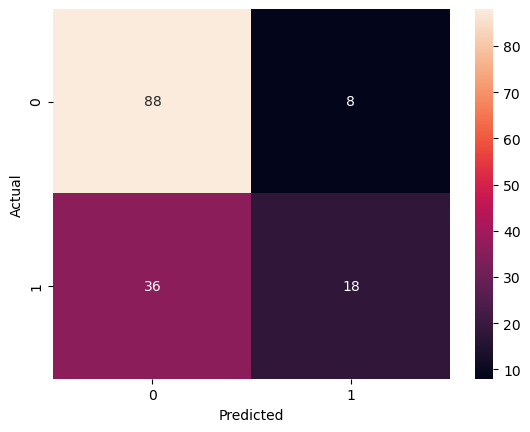

In [37]:
# confusion matrix
confusion_matrix=pd.crosstab(y_test, y_pred, rownames=["Actual"], colnames=["Predicted"])
confusion_matrix
sns.heatmap(confusion_matrix, annot=True)

### Decision Tree

In [38]:
# import relevant librairies
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.metrics import classification_report, accuracy_score

In [39]:
# features extraction
x=data.drop(["ID","Sepssis"], axis=1)
y=data["Sepssis"].values 

In [40]:
# splitting the data with test size of 25%
x_train,x_test,y_train,y_test= train_test_split(x,y, test_size=0.25, random_state=0)
# applying the algorithm
clf=DecisionTreeClassifier(max_depth=3)
# fitting the training data
clf.fit(x_train,y_train)
# testing the model's performance
y_pred=clf.predict(x_test)
print("Accuracry={:.2f}".format(accuracy_score(y_test,y_pred)))

Accuracry=0.71


In [41]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
params = {'max_leaf_nodes': list(range(2, 100)), 'min_samples_split': [2, 3, 4], 'max_depth':list(range(1,10))}
grid_search_cv = GridSearchCV(DecisionTreeClassifier(random_state=0), params, verbose=1, cv=10)
grid_search_cv.fit(x_train, y_train)
grid_search_cv.best_estimator_

Fitting 10 folds for each of 2646 candidates, totalling 26460 fits


DecisionTreeClassifier(max_depth=5, max_leaf_nodes=8, random_state=0)

In [42]:
# applying the algorithm
clf=DecisionTreeClassifier(max_depth=5, max_leaf_nodes=8, random_state=0)
# fitting the training data
clf.fit(x_train,y_train)
# testing the model's performance
y_pred=clf.predict(x_test)
print("Accuracry={:.2f}".format(accuracy_score(y_test,y_pred)))

Accuracry=0.71


In [43]:
# Classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.77      0.78      0.77        96
           1       0.60      0.57      0.58        54

    accuracy                           0.71       150
   macro avg       0.68      0.68      0.68       150
weighted avg       0.70      0.71      0.71       150



In [44]:
# Matthews correlation coefficient
from sklearn.metrics import matthews_corrcoef
matthews_corrcoef(y_test, y_pred)

0.3583788898060863

<AxesSubplot:xlabel='Predicted', ylabel='Actual'>

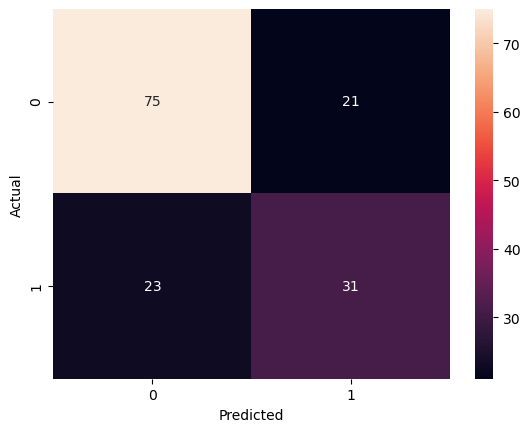

In [45]:
# confusion matrix
confusion_matrix=pd.crosstab(y_test, y_pred, rownames=["Actual"], colnames=["Predicted"])
confusion_matrix
sns.heatmap(confusion_matrix, annot=True)

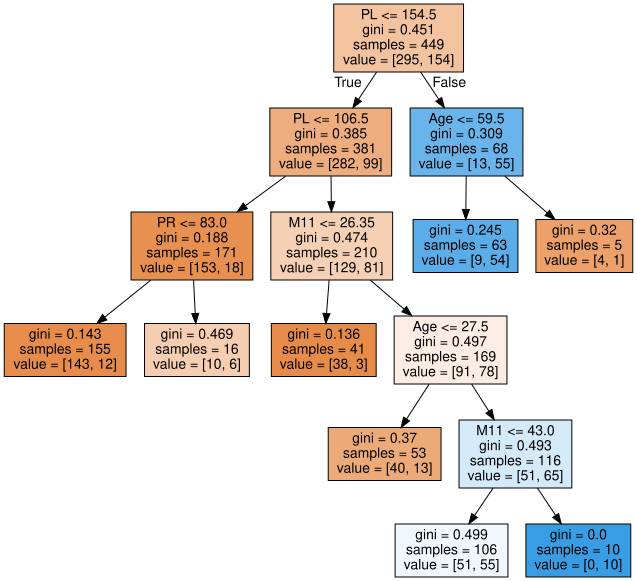

In [46]:
import graphviz
# DOT data
dot_data = tree.export_graphviz(clf, out_file=None, 
                                feature_names=x_train.columns,
                                filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph

### Random Forest

In [47]:
# import relevant libraries 
from sklearn.ensemble import RandomForestClassifier
RF=RandomForestClassifier()
RF.fit(x_train, y_train)
y_pred=RF.predict(x_test)
print("Accuracry={:.2f}".format(accuracy_score(y_test,y_pred)))

Accuracry=0.76


In [48]:
from sklearn.model_selection import GridSearchCV
RF=RandomForestClassifier(random_state=0)
param_grid = { 
    'n_estimators': [200, 500],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}
CV_rf = GridSearchCV(estimator=RF, param_grid=param_grid, cv= 10)
CV_rf.fit(x_train, y_train)
CV_rf.best_params_

{'criterion': 'gini', 'max_depth': 7, 'n_estimators': 200}

In [49]:
RF=RandomForestClassifier(random_state=0, n_estimators= 200, max_depth=7, criterion='gini')
RF.fit(x_train, y_train)
y_pred=RF.predict(x_test)
print("Accuracry={:.2f}".format(accuracy_score(y_test,y_pred)))

Accuracry=0.78


In [50]:
# Classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.79      0.89      0.84        96
           1       0.74      0.59      0.66        54

    accuracy                           0.78       150
   macro avg       0.77      0.74      0.75       150
weighted avg       0.78      0.78      0.77       150



In [51]:
# Matthews correlation coefficient
from sklearn.metrics import matthews_corrcoef
matthews_corrcoef(y_test, y_pred)

0.5073909175767659

<AxesSubplot:xlabel='Predicted', ylabel='Actual'>

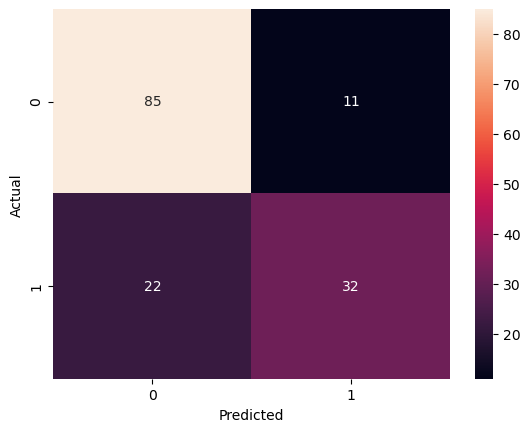

In [52]:
# confusion matrix
confusion_matrix=pd.crosstab(y_test, y_pred, rownames=["Actual"], colnames=["Predicted"])
confusion_matrix
sns.heatmap(confusion_matrix, annot=True)

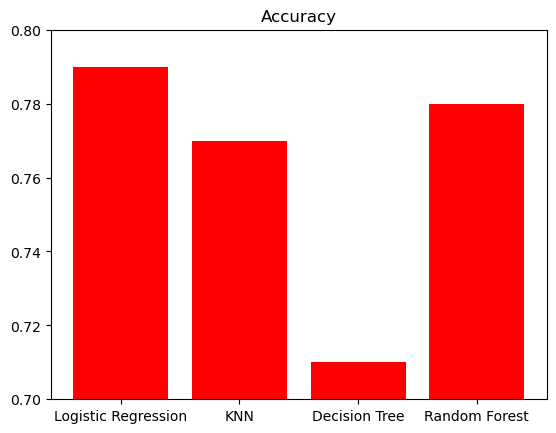

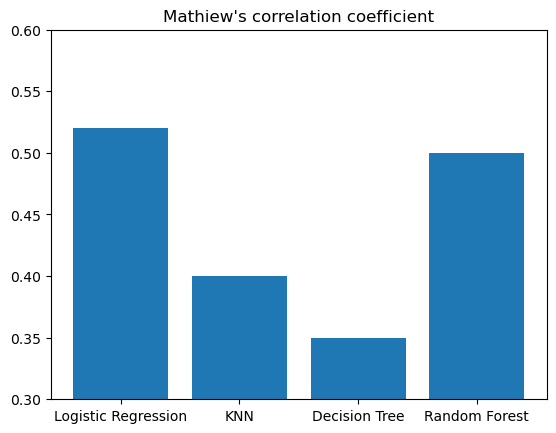

In [53]:
Models=["Logistic Regression","KNN","Decision Tree","Random Forest"]
Accuracy=[0.79,0.77,0.71,0.78]
MCC=[0.52,0.40,0.35,0.50]
plt.bar(Models, Accuracy, color="r")
plt.title("Accuracy")
plt.ylim(0.7,0.8)
plt.show()
plt.bar(Models, MCC)
plt.title("Mathiew's correlation coefficient")
plt.ylim(0.3,0.6)
plt.show()

The best algorithm for this dataset is Logistic regression with an Accuracy=0.79

## 7.Experiment 

Now, we will use the second dataset which didn't contain target values

We will use unsupervised learning in order to discover hidden pattern in the data

In [118]:
# import libraries 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [119]:
df=pd.read_csv("C:/Users/LENOVO/Desktop/archive/Paitients_Files_Test.csv")
df.head()

,ID,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance
0,ICU200609,1,109,38,18,120,23.1,0.407,26,1
1,ICU200610,1,108,88,19,0,27.1,0.400,24,1
2,ICU200611,6,96,0,0,0,23.7,0.190,28,1
3,ICU200612,1,124,74,36,0,27.8,0.100,30,1
4,ICU200613,7,150,78,29,126,35.2,0.692,54,0


In [120]:
df.isnull().sum().sum()

0

In [121]:
df=df.drop("ID", axis=1)
df

,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance
0,1,109,38,18,120,23.1,0.407,26,1
1,1,108,88,19,0,27.1,0.400,24,1
2,6,96,0,0,0,23.7,0.190,28,1
3,1,124,74,36,0,27.8,0.100,30,1
4,7,150,78,29,126,35.2,0.692,54,0
...,...,...,...,...,...,...,...,...,...
164,10,101,76,48,180,32.9,0.171,63,1
165,2,122,70,27,0,36.8,0.340,27,1
166,5,121,72,23,112,26.2,0.245,30,1
167,1,126,60,0,0,30.1,0.349,47,1


### K-means

In [122]:
std=df[:]
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaled_values = scaler.fit_transform(std) 
std.loc[:,:] = scaled_values
std

,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance
0,-0.859927,-0.497755,-1.674099,-0.155474,0.353284,-1.232644,-0.104160,-0.613614,0.611542
1,-0.859927,-0.532034,0.907313,-0.091854,-0.733744,-0.693766,-0.127034,-0.787317,0.611542
2,0.613984,-0.943381,-3.635972,-1.300640,-0.733744,-1.151812,-0.813250,-0.439911,0.611542
3,-0.859927,0.016430,0.184518,0.989691,-0.733744,-0.599462,-1.107343,-0.266208,0.611542
4,0.908767,0.907682,0.391030,0.544349,0.407635,0.397463,0.827133,1.818231,-1.635210
...,...,...,...,...,...,...,...,...,...
164,1.793114,-0.771986,0.287774,1.753135,0.896798,0.087608,-0.875337,2.599895,0.611542
165,-0.565145,-0.052128,-0.021995,0.417108,-0.733744,0.613014,-0.323096,-0.526763,0.611542
166,0.319202,-0.086407,0.081261,0.162627,0.280815,-0.815014,-0.633527,-0.266208,0.611542
167,-0.859927,0.084987,-0.538278,-1.300640,-0.733744,-0.289607,-0.293687,1.210269,0.611542


In [123]:
from sklearn.cluster import KMeans  #Importing our clustering algorithm: KMeans
kmeans=KMeans(n_clusters=3, random_state=0)  #Cluster our data by choosing 3 as number of clusters
kmeans.fit(std)
labels=pd.DataFrame(kmeans.labels_)
labels
kmeans.predict(std)

array([0, 0, 0, 0, 2, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 2, 0, 0, 0, 2, 0, 1,
       0, 2, 1, 0, 1, 0, 0, 2, 0, 0, 1, 0, 1, 0, 2, 2, 0, 1, 0, 0, 0, 2,
       0, 1, 1, 1, 1, 2, 0, 0, 1, 1, 0, 0, 1, 0, 1, 2, 1, 2, 1, 2, 2, 2,
       1, 2, 2, 1, 2, 2, 0, 2, 1, 2, 2, 2, 0, 0, 0, 0, 1, 1, 0, 2, 1, 0,
       0, 1, 1, 2, 2, 1, 1, 0, 1, 1, 0, 1, 0, 1, 2, 2, 0, 0, 0, 0, 1, 2,
       1, 1, 2, 2, 1, 0, 1, 1, 2, 1, 2, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 2, 0, 0, 2, 0, 0, 2, 2, 2, 1, 1, 1, 2, 0, 1, 0,
       1, 2, 1, 2, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0])

In [124]:
print(kmeans.cluster_centers_)   #Printing the coordinates of cluster centers.

[[-0.36585531 -0.52092907 -0.50337428 -0.56228605 -0.45177986 -0.4897891
  -0.27085877 -0.49618111  0.20016488]
 [-0.50082861  0.36856777  0.21267836  0.79535998  0.88098639  0.62330155
   0.27780375 -0.3641133  -0.2871589 ]
 [ 1.2446814   0.3887148   0.55912242 -0.08889509 -0.38088096  0.01147536
   0.09190154  1.28500209  0.03679146]]


In [125]:
std.insert(2,'label', labels[0])

In [94]:
from sklearn.cluster import KMeans  #Importing our clustering algorithm: KMeans
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 0
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(std)
    sse.append(kmeans.inertia_)

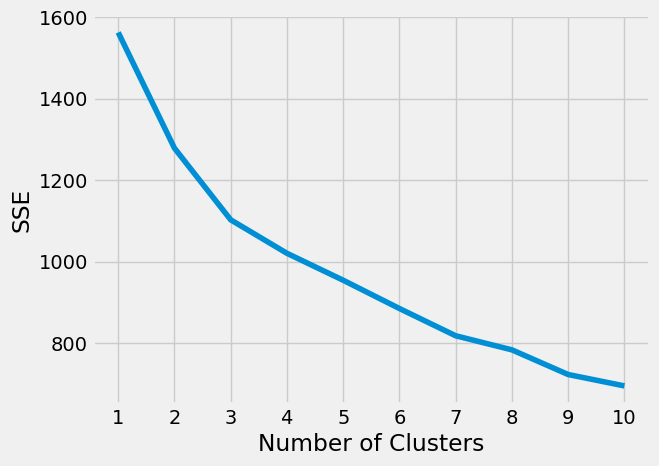

In [95]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [96]:
from kneed import KneeLocator
kl = KneeLocator(range(1, 11), sse, curve="convex", direction="decreasing")
kl.elbow

3

In [97]:
# Silhouette Coefficients
from sklearn.metrics import silhouette_score
# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(std)
    score = silhouette_score(scaled_values, kmeans.labels_)
    silhouette_coefficients.append(score)

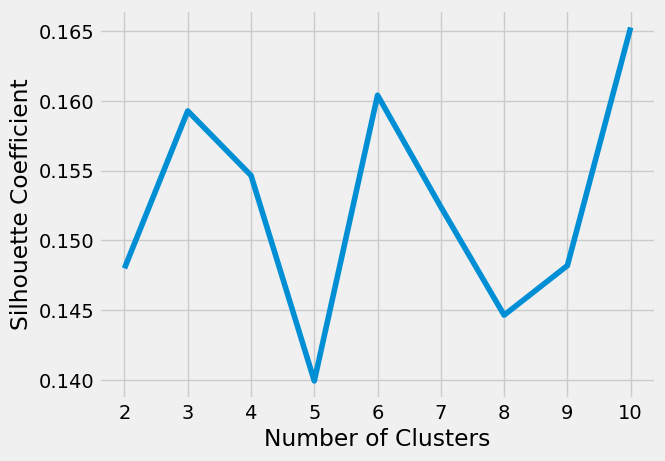

In [98]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

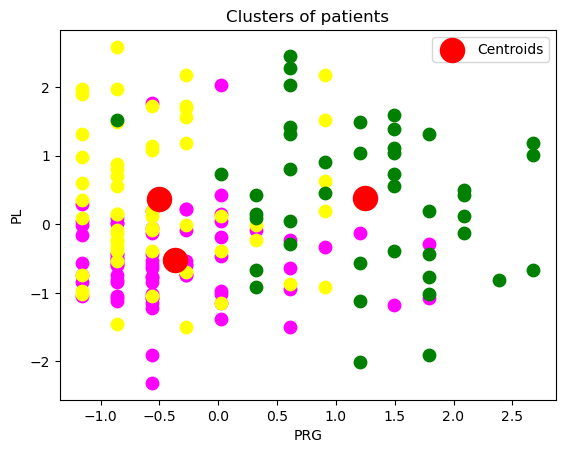

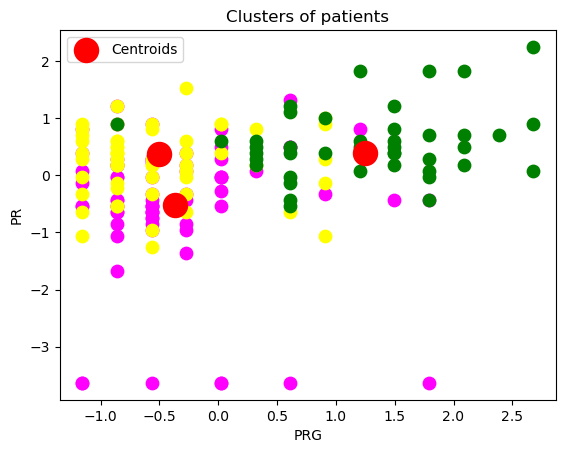

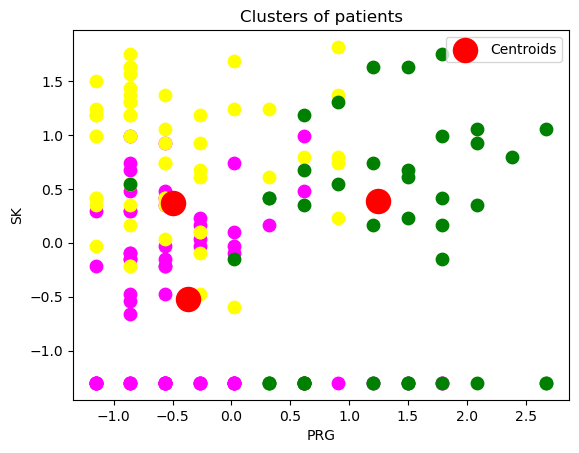

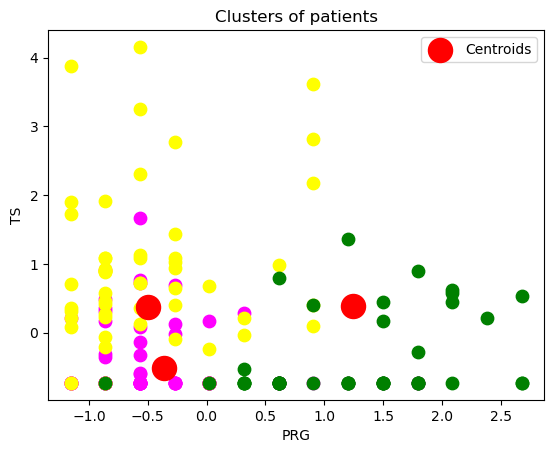

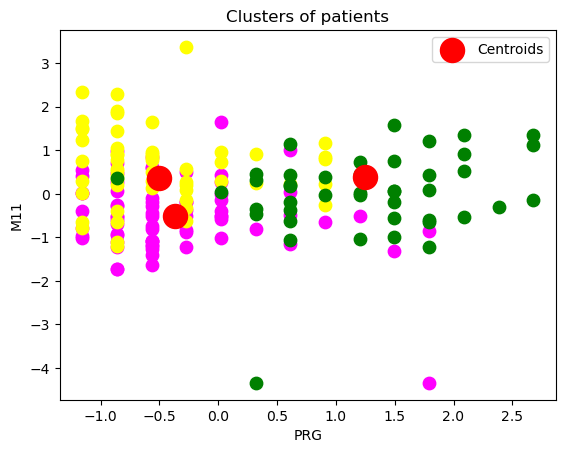

...

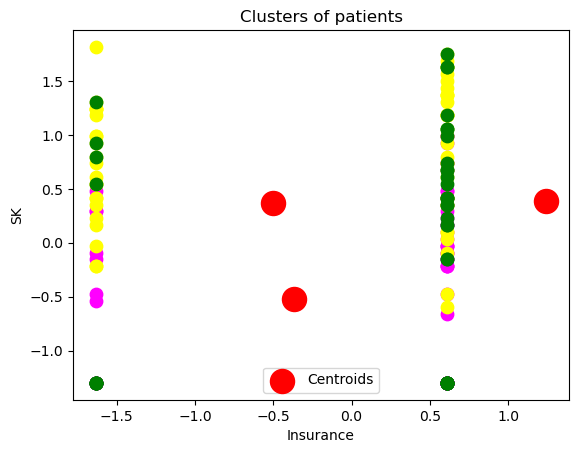

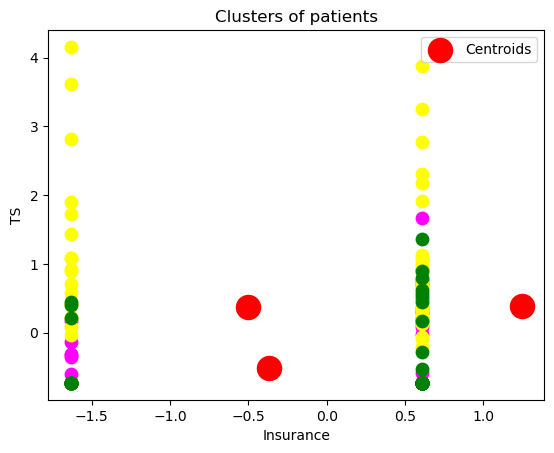

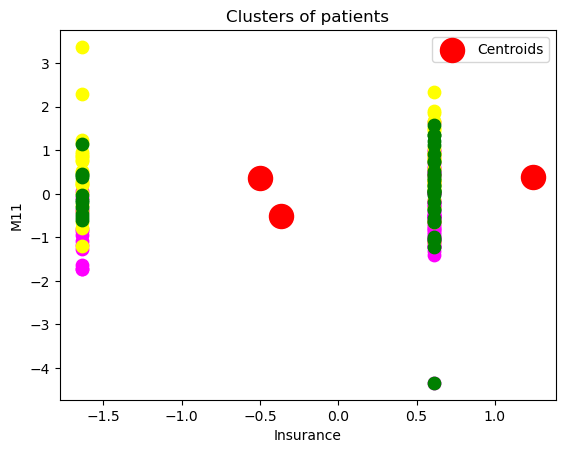

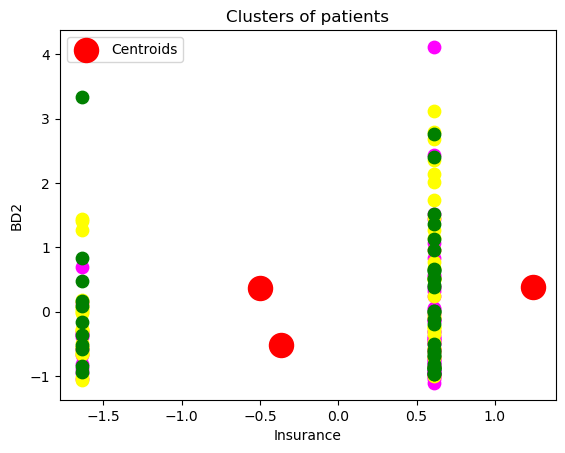

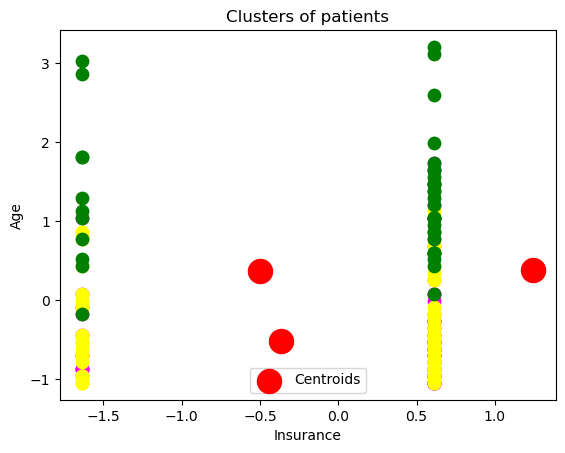

In [126]:
# Plotting the centroids
plt.style.use("default")
for col1 in ["PRG","PL","PR","SK","TS","M11","BD2","Age","Insurance"]:
    for col2 in ["PRG","PL","PR","SK","TS","M11","BD2","Age","Insurance"]:
        if col1!=col2:
            plt.scatter(std[col1][std.label == 0],          
                        std[col2][std.label == 0],s=80,c='magenta')
            plt.scatter(std[col1][std.label == 1],          
                        std[col2][std.label == 1],s=80,c='yellow')
            plt.scatter(std[col1][std.label == 2],          
                        std[col2][std.label == 2],s=80,c='green')
            plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red', label = 'Centroids')
            plt.title('Clusters of patients')
            plt.xlabel(col1)
            plt.ylabel(col2)
            plt.legend()
            plt.show()

It seems that the best figues were with the variable "Age", so let's take a deep look on these figures!!!

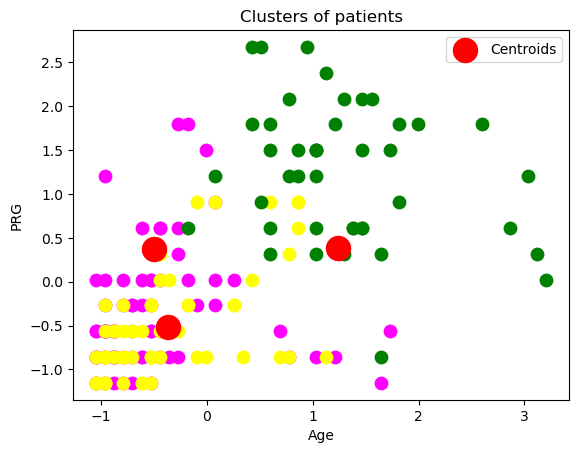

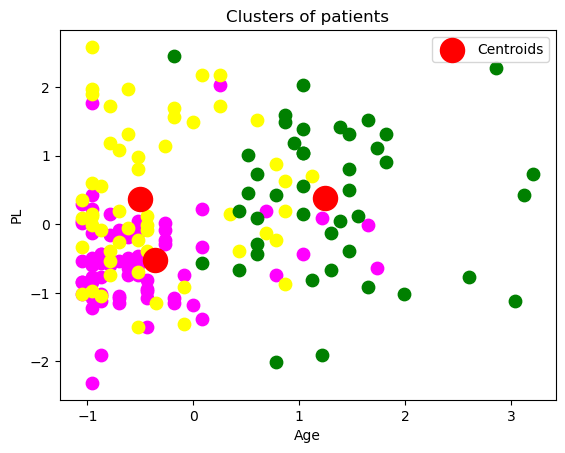

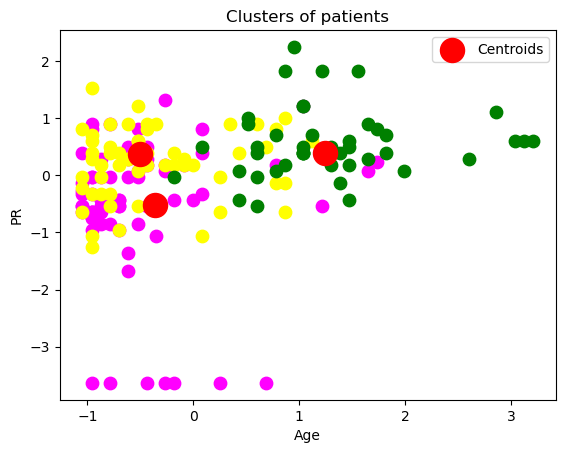

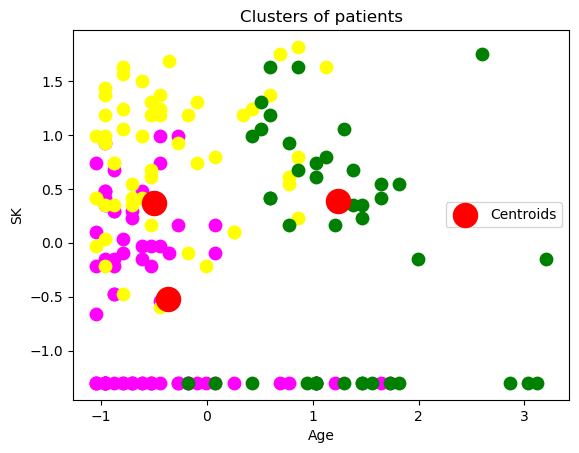

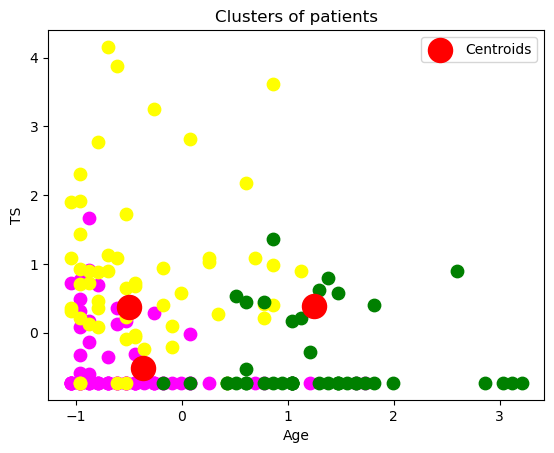

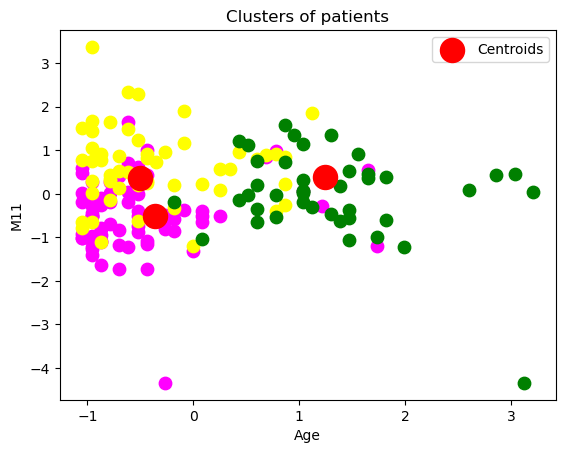

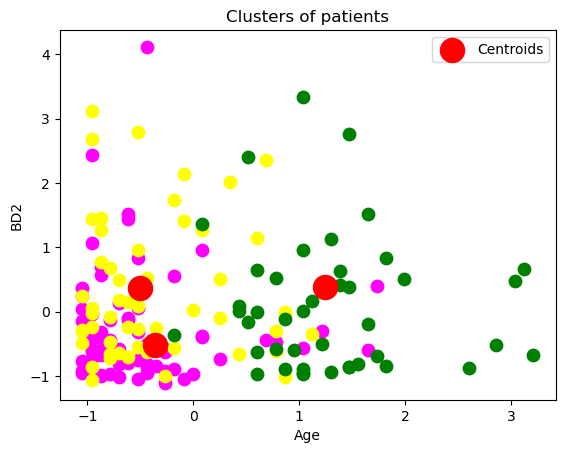

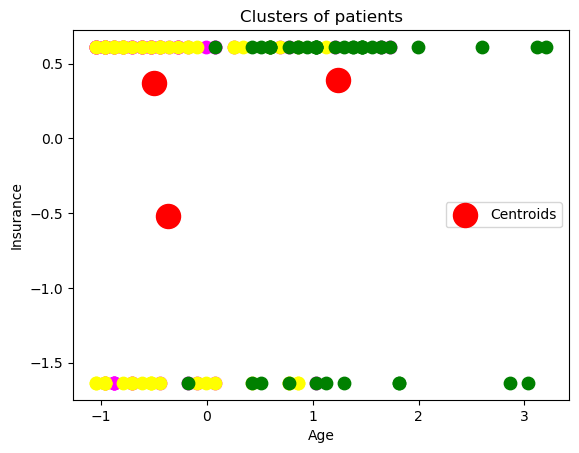

In [131]:
# Plotting the centroids
plt.style.use("default")
for col in ["PRG","PL","PR","SK","TS","M11","BD2","Insurance"]:
    plt.scatter(std["Age"][std.label == 0],          
                std[col][std.label == 0],s=80,c='magenta')
    plt.scatter(std["Age"][std.label == 1],          
                std[col][std.label == 1],s=80,c='yellow')
    plt.scatter(std["Age"][std.label == 2],          
                std[col][std.label == 2],s=80,c='green')
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red', label = 'Centroids')
    plt.title('Clusters of patients')
    plt.xlabel("Age")
    plt.ylabel(col)
    plt.legend()
    plt.show()

From the figures we notice that the patients can be devided into 3 clusters:

- young patients with low blood results and blood pressure 

- young patients with high blood results and blood pressure

- older patients with high blood results and blood pressure 

### Hierarchical clustering

In [127]:
from sklearn.cluster import AgglomerativeClustering #Importing our clustering algorithm : Agglomerative
model=AgglomerativeClustering(n_clusters=3, affinity='manhattan', linkage='complete')
clust_labels=model.fit_predict(df)  #Applying agglomerative algorithm with 3 clusters, using manhattan distance as a metric

In [128]:
agglomerative=pd.DataFrame(clust_labels)
agglomerative

,0
0,0
1,2
2,2
3,2
4,0
...,...
164,0
165,2
166,0
167,2


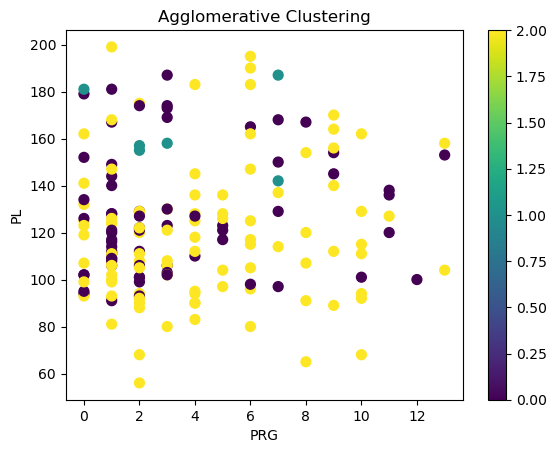

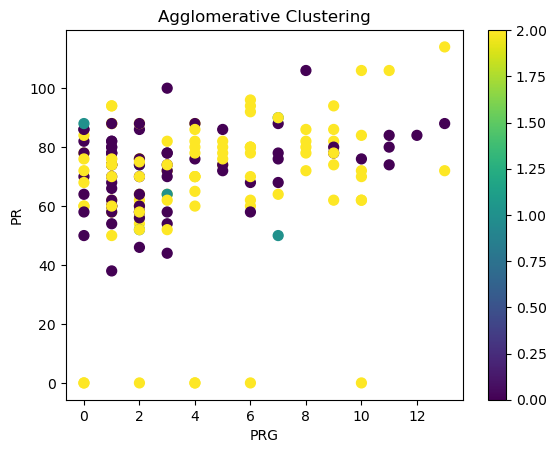

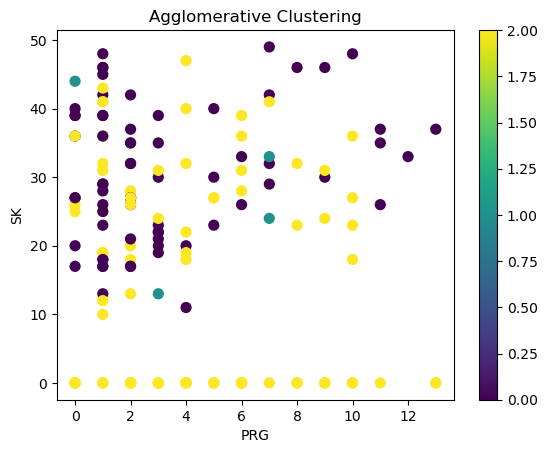

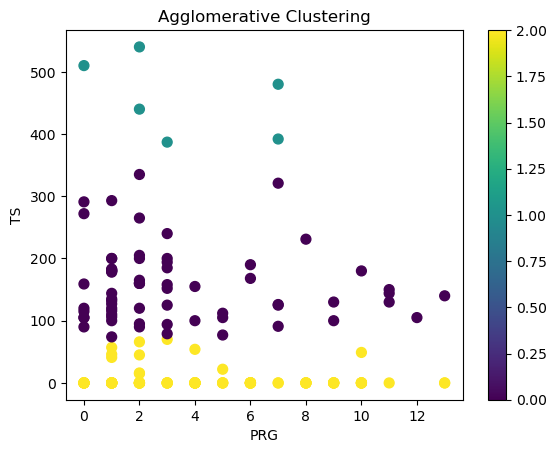

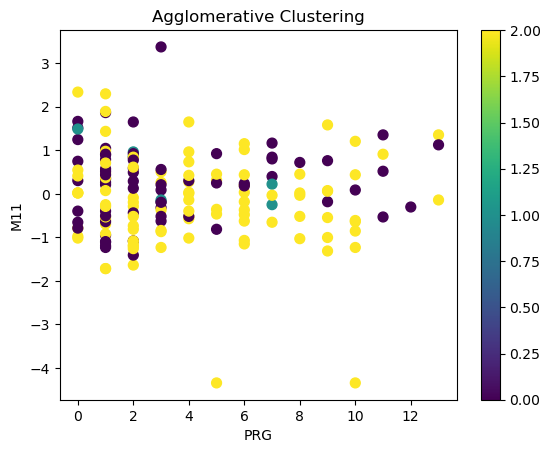

...

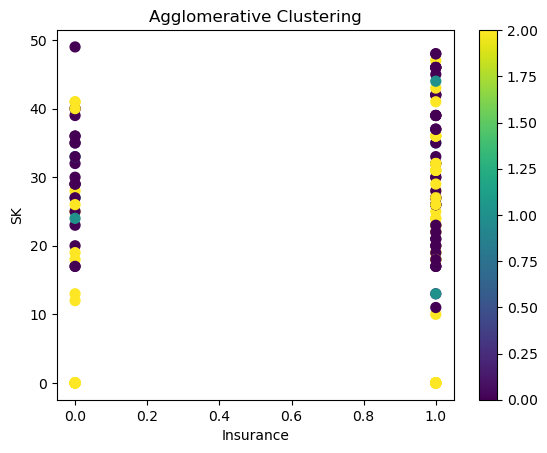

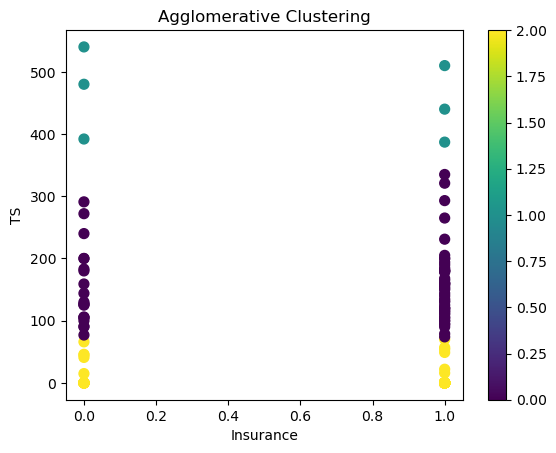

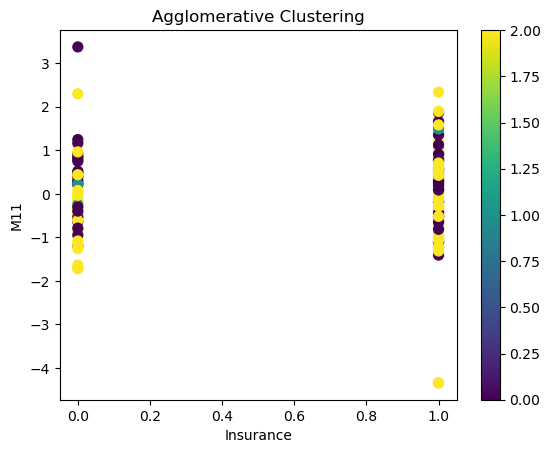

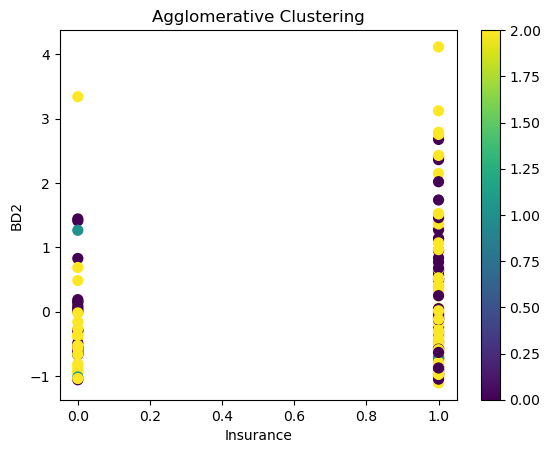

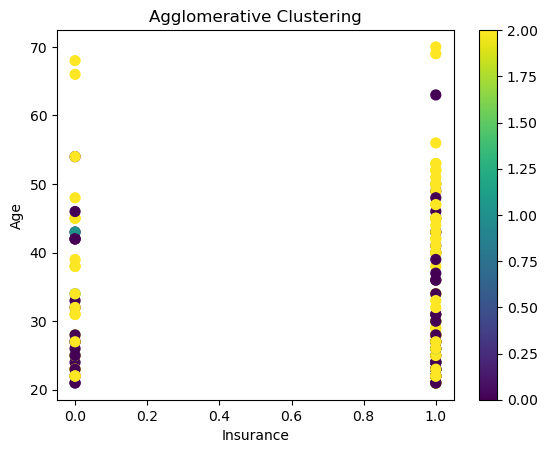

In [129]:
import matplotlib.pyplot as plt
for col1 in df.columns:
    for col2 in df.columns:
        if col1!=col2:
            fig =plt.figure()
            ax = fig.add_subplot(111)
            scatter = ax.scatter (df [col1] , df [col2], c= agglomerative[0], s=50)
            ax.set_title("Agglomerative Clustering")
            ax.set_xlabel(col1)
            ax.set_ylabel(col2)
            plt.colorbar(scatter)

It seems that the best figues were with the variable "Age", so let's take a deep look on these figures!!!

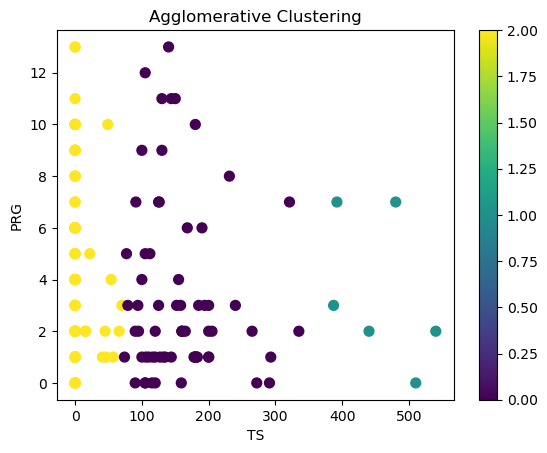

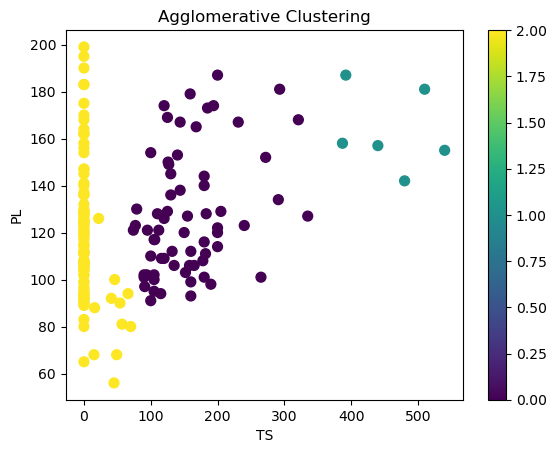

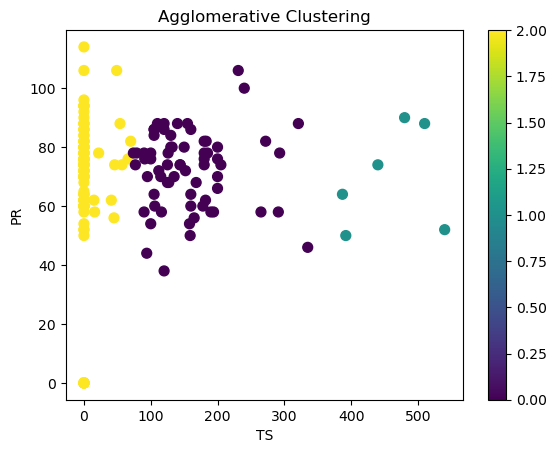

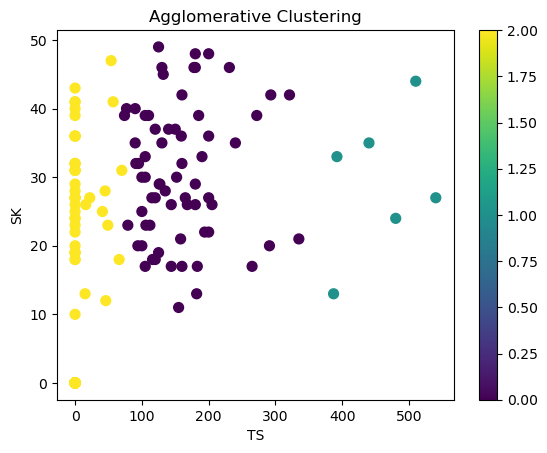

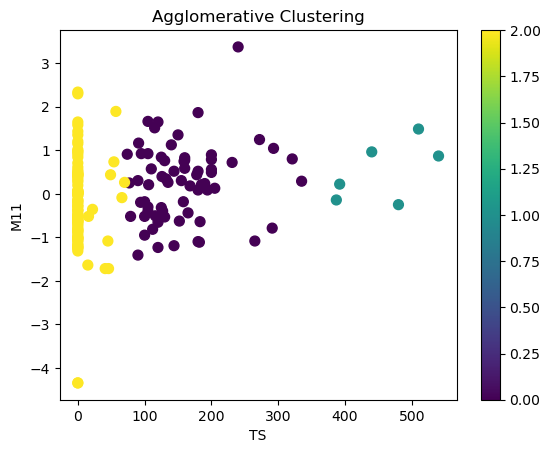

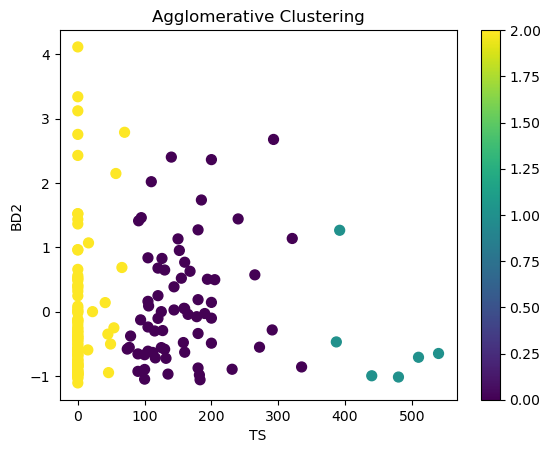

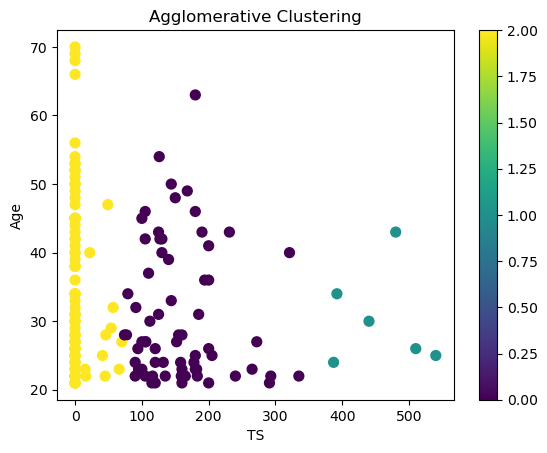

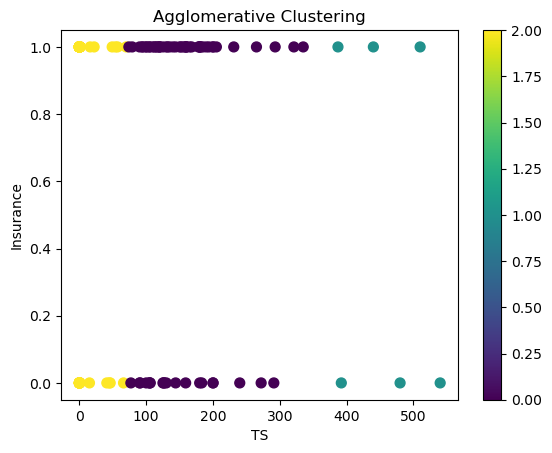

In [132]:
import matplotlib.pyplot as plt
for col in ["PRG","PL","PR","SK","M11","BD2","Age","Insurance"]:
    fig =plt.figure()
    ax = fig.add_subplot(111)
    scatter = ax.scatter (df ["TS"] , df [col], c= agglomerative[0], s=50)
    ax.set_title("Agglomerative Clustering")
    ax.set_xlabel("TS")
    ax.set_ylabel(col)
    plt.colorbar(scatter)

The figures showed that the patients could be clustered in 3 groups depending on TS concentrations:

- 0-80

- 80-300

- more than 300


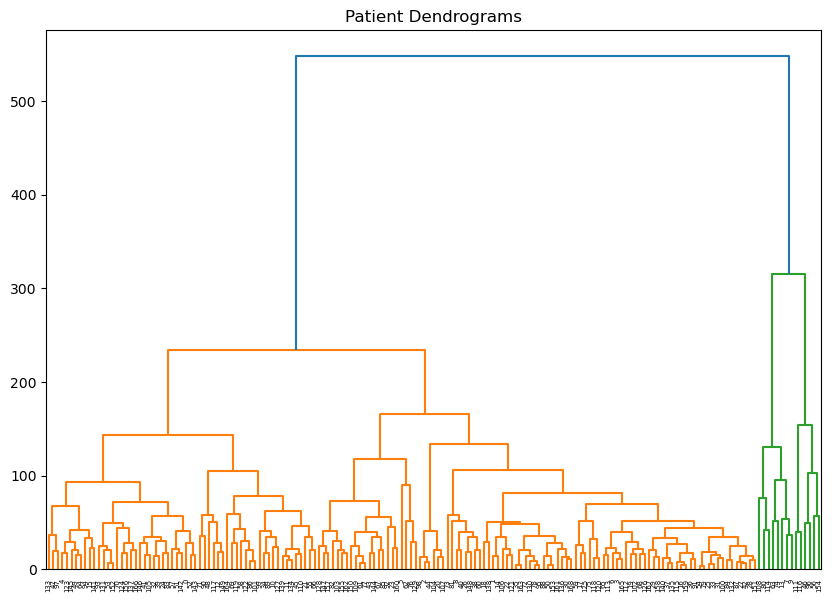

In [130]:
# Plot the dendrogram
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10,7))
plt.title("Patient Dendrograms")
dend=shc.dendrogram(shc.linkage(df, method="complete"))

If we transform "TS" from numerical to categorical, would it improve our models working on the first dataset?

Let's try to find out!!!

In [140]:
data=pd.read_csv("C:/Users/LENOVO/Desktop/archive/Paitients_Files_Train.csv")
data.head()

,ID,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,Sepssis
0,ICU200010,6,148,72,35,0,33.6,0.627,50,0,Positive
1,ICU200011,1,85,66,29,0,26.6,0.351,31,0,Negative
2,ICU200012,8,183,64,0,0,23.3,0.672,32,1,Positive
3,ICU200013,1,89,66,23,94,28.1,0.167,21,1,Negative
4,ICU200014,0,137,40,35,168,43.1,2.288,33,1,Positive


In [141]:
def trans_TS (x):
    if x<80:
        return "Low"
    elif x>=80 and x<=300:
        return "Medium"
    else:
        return "High"

data["TS_cat"]=data["TS"].apply(trans_TS)
data["TS_cat"].value_counts()

Low       380
Medium    190
High       29
Name: TS_cat, dtype: int64

In [142]:
data=data.drop(["ID","TS"], axis=1)
data.head()

,PRG,PL,PR,SK,M11,BD2,Age,Insurance,Sepssis,TS_cat
0,6,148,72,35,33.6,0.627,50,0,Positive,Low
1,1,85,66,29,26.6,0.351,31,0,Negative,Low
2,8,183,64,0,23.3,0.672,32,1,Positive,Low
3,1,89,66,23,28.1,0.167,21,1,Negative,Medium
4,0,137,40,35,43.1,2.288,33,1,Positive,Medium


In [143]:
data['Sepssis'] = data['Sepssis'].map({'Positive': 1, 'Negative': 0})
data['TS_cat'] = data['TS_cat'].map({'Low': 0, 'Medium': 1, "High":2})
data.head()

,PRG,PL,PR,SK,M11,BD2,Age,Insurance,Sepssis,TS_cat
0,6,148,72,35,33.6,0.627,50,0,1,0
1,1,85,66,29,26.6,0.351,31,0,0,0
2,8,183,64,0,23.3,0.672,32,1,1,0
3,1,89,66,23,28.1,0.167,21,1,0,1
4,0,137,40,35,43.1,2.288,33,1,1,1


### Logistic regression

In [145]:
# features extraction
x=data.drop("Sepssis", axis=1)
y=data["Sepssis"].values

In [146]:
# splitting the data with test size of 25%
x_train,x_test,y_train,y_test= train_test_split(x,y, test_size=0.25, random_state=0)
# build logistic regression 
logreg=LogisticRegression()
# fitting the training data
logreg.fit(x_train,y_train)
# testing the model's performance
y_pred=logreg.predict(x_test)
print("Accuracry={:.2f}".format(logreg.score(x_test,y_test)))

Accuracry=0.79


### KNN

In [148]:
#feature Scaling  
from sklearn.preprocessing import StandardScaler    
st_x= StandardScaler()    
x_train= st_x.fit_transform(x_train)    
x_test= st_x.transform(x_test)  

In [149]:
knn = KNeighborsClassifier()
from sklearn.model_selection import GridSearchCV
k_range = list(range(1, 51))
metric=["euclidean", "manhattan", "minkowski"]
param_grid = dict(n_neighbors=k_range, metric=metric)
  
# defining parameter range
grid = GridSearchCV(knn, param_grid, cv=10, scoring='accuracy', return_train_score=False,verbose=1)
  
# fitting the model for grid search
grid_search=grid.fit(x_train, y_train)
print(grid_search.best_params_)

Fitting 10 folds for each of 150 candidates, totalling 1500 fits
{'metric': 'euclidean', 'n_neighbors': 19}


In [150]:
#Fitting K-NN classifier to the training set  
from sklearn.neighbors import KNeighborsClassifier  
knn= KNeighborsClassifier(n_neighbors=19, metric="euclidean")  
knn.fit(x_train, y_train)  
#Predicting the test set result  
y_pred= knn.predict(x_test)  
from sklearn.metrics import accuracy_score
print("Accuracy= ", accuracy_score(y_pred, y_test))

Accuracy=  0.74


### Decision Tree

In [153]:
data=pd.read_csv("C:/Users/LENOVO/Desktop/archive/Paitients_Files_Train.csv")
def trans_TS (x):
    if x<80:
        return "Low"
    elif x>=80 and x<=300:
        return "Medium"
    else:
        return "High"

data["TS_cat"]=data["TS"].apply(trans_TS)
data=data.drop(["ID","TS"], axis=1)
data['Sepssis'] = data['Sepssis'].map({'Positive': 1, 'Negative': 0})
data['TS_cat'] = data['TS_cat'].map({'Low': 0, 'Medium': 1, "High":2})
data.head()

,PRG,PL,PR,SK,M11,BD2,Age,Insurance,Sepssis,TS_cat
0,6,148,72,35,33.6,0.627,50,0,1,0
1,1,85,66,29,26.6,0.351,31,0,0,0
2,8,183,64,0,23.3,0.672,32,1,1,0
3,1,89,66,23,28.1,0.167,21,1,0,1
4,0,137,40,35,43.1,2.288,33,1,1,1


In [154]:
# features extraction
x=data.drop("Sepssis", axis=1)
y=data["Sepssis"].values

In [155]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
params = {'max_leaf_nodes': list(range(2, 100)), 'min_samples_split': [2, 3, 4], 'max_depth':list(range(1,10))}
grid_search_cv = GridSearchCV(DecisionTreeClassifier(random_state=0), params, verbose=1, cv=10)
grid_search_cv.fit(x_train, y_train)
grid_search_cv.best_estimator_

Fitting 10 folds for each of 2646 candidates, totalling 26460 fits


DecisionTreeClassifier(max_depth=5, max_leaf_nodes=8, random_state=0)

In [156]:
# applying the algorithm
clf=DecisionTreeClassifier(max_depth=5, max_leaf_nodes=8, random_state=0)
# fitting the training data
clf.fit(x_train,y_train)
# testing the model's performance
y_pred=clf.predict(x_test)
print("Accuracry={:.2f}".format(accuracy_score(y_test,y_pred)))

Accuracry=0.71


In [157]:
from sklearn.model_selection import GridSearchCV
RF=RandomForestClassifier(random_state=0)
param_grid = { 
    'n_estimators': [200, 500],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}
CV_rf = GridSearchCV(estimator=RF, param_grid=param_grid, cv= 10)
CV_rf.fit(x_train, y_train)
CV_rf.best_params_

{'criterion': 'gini', 'max_depth': 6, 'n_estimators': 500}

In [158]:
RF=RandomForestClassifier(random_state=0, n_estimators= 500, max_depth=6, criterion='gini')
RF.fit(x_train, y_train)
y_pred=RF.predict(x_test)
print("Accuracry={:.2f}".format(accuracy_score(y_test,y_pred)))

Accuracry=0.77


In [173]:
results={"Logistic Regression":{"1st Model":0.79, "2nd Model":0.79},
        "KNN":{"1st Model":0.77, "2nd Model":0.74},
        "Decision Tree":{"1st Model":0.71, "2nd Model":0.71},
        "Random Forest":{"1st Model":0.78, "2nd Model":0.77}
        }
results=pd.DataFrame(results)
results

,Logistic Regression,KNN,Decision Tree,Random Forest
1st Model,0.79,0.77,0.71,0.78
2nd Model,0.79,0.74,0.71,0.77


## Summary

As shown by the table of the Accuracies, Logistic regression are the best models found for this dataset.

Transforming TS doesn't improve the models.

Thus, it is more suitable to apply Logistic Regression on the dataset without further transformation.

The best achievable Accuracy is 79%.